# ***Neurotechnology & BCI Theory***
## **Artifact Rejection**
### *Abhishek Amit Raje:BM22BTECH11002*

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import sklearn
from sklearn.decomposition import FastICA


##**Assignment - Part-A - Simulation**

### **1. Generate three signal components - square, sawtooth and sine wave of 200 seconds at a sampling rate of 1kHz**

*Defining Orignal Signal as*
$$
y_1(t)=A\sin(2\pi ft)
$$
$$
y_2(t)=2A\left(2\pi f.t-[2\pi f.t+\frac{1}{2}]\right)
$$
$$
y_3(t)=A\text{sign}(\sin(2πft))
$$


In [ ]:
class generate_signal:
    def __init__(self, amplitude, frequency, duration, sampling_rate):
        self.amplitude = amplitude
        self.frequency = frequency
        self.duration = duration
        self.sampling_rate = sampling_rate

    def generate_square_wave(self):
        t = np.linspace(0, self.duration, int(self.duration * self.sampling_rate), endpoint=False)
        square_wave = self.amplitude * signal.square(2 * np.pi * self.frequency * t)
        return square_wave

    def generate_sawtooth_wave(self):
        t = np.linspace(0, self.duration, int(self.duration * self.sampling_rate), endpoint=False)
        sawtooth_wave = self.amplitude * signal.sawtooth(2 * np.pi * self.frequency * t)
        return sawtooth_wave

    def generate_sine_wave(self):
        t = np.linspace(0, self.duration, int(self.duration * self.sampling_rate), endpoint=False)
        sine_wave = self.amplitude * np.sin(2 * np.pi * self.frequency * t)
        return sine_wave
    def plot_signals(self, signal1, signal2, signal3):
        t = np.linspace(0, self.duration, int(self.duration * self.sampling_rate), endpoint=False)

        fig, axes = plt.subplots(3, 1, figsize=(8, 6), sharex=True)

        signals = [signal1, signal2, signal3]
        titles = ["Signal 1", "Signal 2", "Signal 3"]
        colors = ["lawngreen", "dodgerblue", "tomato"]

        for i, (signal, title, color) in enumerate(zip(signals, titles, colors)):
            axes[i].plot(t, signal, color=color, alpha=0.9)
            axes[i].set_title(title)
            axes[i].set_ylabel("Amplitude")

        axes[-1].set_xlabel("Time")
        plt.tight_layout()
        plt.show()


In [ ]:
signal_generator = generate_signal(2, 0.025, 200, 1000)

In [ ]:
square_wave=signal_generator.generate_square_wave()
sawtooth_wave=signal_generator.generate_sawtooth_wave()
sine_wave=signal_generator.generate_sine_wave()

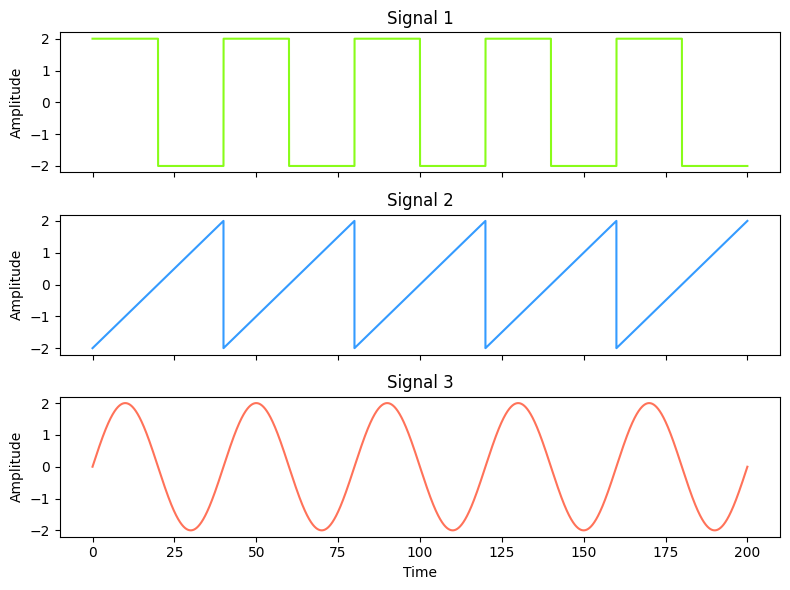

In [ ]:
signal_generator.plot_signals(square_wave,sawtooth_wave,sine_wave)

### **2. Mix the signals in the following combinations**

*Computing*
$$
y(t)=\alpha x_1(t)+βx_2(t)+γx_3(t)
$$


In [ ]:
class signal_mixer:
    def __init__(self,apha, signal1, beta, signal2, gamma,signal3,sampling_rate):
        self.apha = apha
        self.signal1 = signal1
        self.beta = beta
        self.signal2 = signal2
        self.gamma = gamma
        self.signal3 = signal3
        self.sampling_rate = sampling_rate
    def mix_signal(self):
        mixed_signal = self.apha * self.signal1 + self.beta * self.signal2 + self.gamma * self.signal3
        return mixed_signal
    def standardize_signal(self, mixed_signal):
        standardized_signal = (mixed_signal - np.mean(mixed_signal)) / np.std(mixed_signal)
        return standardized_signal
    def add_noise(self, standardized_signal):
        noise = np.random.normal(0, 0.1, len(standardized_signal))
        noisy_signal = standardized_signal + noise
        return noisy_signal
    def plot_signals(self, signal1, signal2, signal3):
        t = np.linspace(0, 200, int(200 * self.sampling_rate), endpoint=False)

        fig, axes = plt.subplots(3, 1, figsize=(8, 6), sharex=True)

        signals = [signal1, signal2, signal3]
        titles = ["Mixed Signal 1", "Mixed Signal 2", "Mixed Signal 3"]
        colors = ["deeppink", "royalblue", "limegreen"]

        for i, (signal, title, color) in enumerate(zip(signals, titles, colors)):
            axes[i].plot(t, signal, color=color, alpha=0.9)
            axes[i].set_title(title)
            axes[i].set_ylabel("Amplitude")

        axes[-1].set_xlabel("Time")
        plt.tight_layout()
        plt.show()


*a. Square: 20%; Sine: 20%; Sawtooth: 60%*

*b.Square: 33%; Sine: 33%; Sawtooth: 34%*

*c.Square: 60%; Sine: 20%; Sawtooth: 20%*

In [ ]:
signal_mixer1=signal_mixer(0.2,square_wave,0.2,sine_wave,0.6,sawtooth_wave,1000)
mixed_signal1=signal_mixer1.mix_signal()
signal_mixer2=signal_mixer(0.33,square_wave,0.33,sine_wave,0.34,sawtooth_wave,1000)
mixed_signal2=signal_mixer2.mix_signal()
signal_mixer3=signal_mixer(0.6,square_wave,0.2,sine_wave,0.2,sawtooth_wave,1000)
mixed_signal3=signal_mixer3.mix_signal()

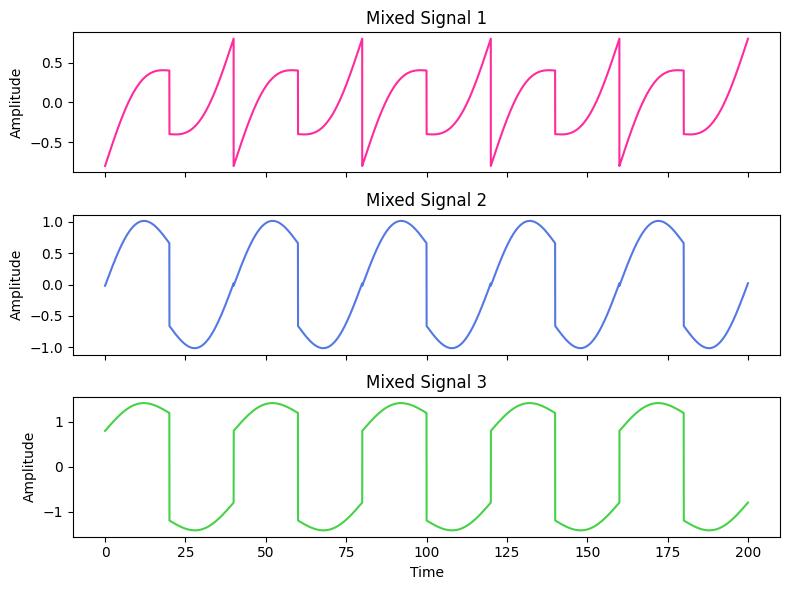

In [ ]:
signal_mixer1.plot_signals(mixed_signal1,mixed_signal2,mixed_signal3)  # Or use signal_mixer2 or signal_mixer3

In [ ]:
standardized_signal_1=signal_mixer1.standardize_signal(mixed_signal1)
noisy_signal_1=signal_mixer1.add_noise(standardized_signal_1)
standardized_signal_2=signal_mixer2.standardize_signal(mixed_signal2)
noisy_signal_2=signal_mixer2.add_noise(standardized_signal_2)
standardized_signal_3=signal_mixer3.standardize_signal(mixed_signal3)
noisy_signal_3=signal_mixer3.add_noise(standardized_signal_3)
# noisy_signal_1=standardized_signal_1
# noisy_signal_2=standardized_signal_2
# noisy_signal_3=standardized_signal_3

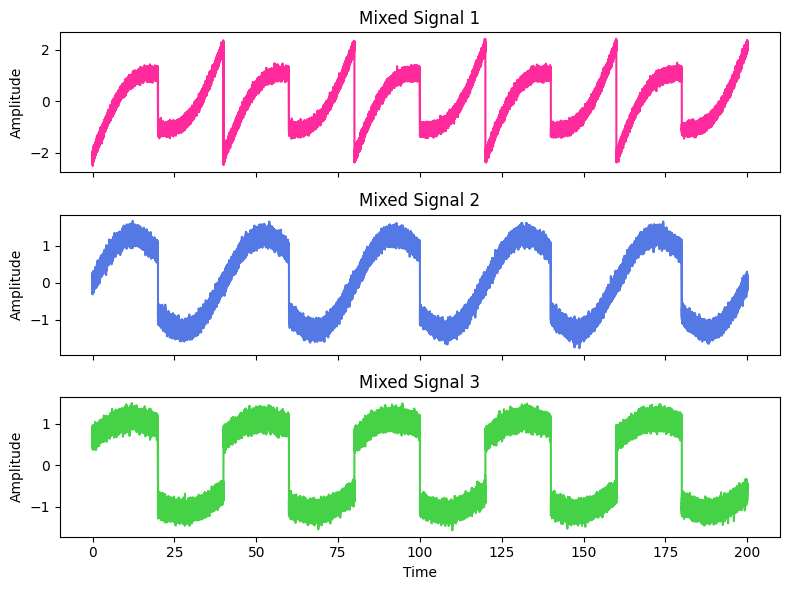

In [ ]:
signal_mixer1.plot_signals(noisy_signal_1,noisy_signal_2,noisy_signal_3)

### **3. Deploy ICA and PCA to separate the signals into components**

*Principal Component Analysis*

* Principal component analysis  is a technique in statistics that is to determine basis vector in the vector space such that the $Var(X)$ of the projected distribution on the new basis vectors is maximized
* Let the signal be represented as

A general $(m \times n$) signal matrix can be represented as:

$$
X = \begin{bmatrix}
x_{11} & x_{12} & x_{13} & \dots & x_{1n} \\
x_{21} & x_{22} & x_{23} & \dots & x_{2n} \\
x_{31} & x_{32} & x_{33} & \dots & x_{3n} \\
\vdots & \vdots & \vdots & \ddots & \vdots \\
x_{m1} & x_{m2} & x_{m3} & \dots & x_{mn}
\end{bmatrix}
$$

* Where:

   - $n$ is the number of signals \\
   - $m$ is the number of samples in each signal  

* The matrix $X$ is then standardized accross each colum corresponding to the mean of the signal
$$X_{std}=\frac{X-μ}{\sigma}$$

* Computing Covariance Matrix :
The Covariance matrix $ (n × n)$is defined as $Cov(X)=\frac{1}{n-1}X^TX$

* Eighen Value Decomposition
$$|Cov-\lambda I|=0$$
*The corresponding eighen vectors would be the changed basis of the vector space
* By taking the top $k$ eighen vectors the same data can be projected onto a lower dimension for dimensionality reduction





In [ ]:
class PCA:
  def __init__(self,X,n_components):
    self.X = self.standardize(X)
    self.n_components = n_components
  def standardize(self, X):
    mean = np.mean(X, axis=0)
    std = np.std(X, axis=0, ddof=0)
    return (X - mean) / std
  def compute_covariance(self):
    X_centered = self.X - np.mean(self.X, axis=0)
    return (X_centered.T @ X_centered) / X.shape[0]
  def compute_eigenvalues_eigenvectors(self,cov):
    eigenvalues, eigenvectors = np.linalg.eig(cov)
    return eigenvalues,eigenvectors
  def eighen_matrix(self,eigenvalues,eigenvectors,n_components):
    sorted_indices = np.argsort(eigenvalues)[::-1]
    sorted_eigenvalues = eigenvalues[sorted_indices]
    sorted_eigenvectors = eigenvectors[:, sorted_indices]
    selected_eigenvectors = sorted_eigenvectors[:, :n_components]
    return selected_eigenvectors
  def compute_transformation(self):
    eigenvalues,eigenvectors=self.compute_eigenvalues_eigenvectors(self.compute_covariance())
    eighen_vectors=self.eighen_matrix(eigenvalues,eigenvectors,self.n_components)
    transformation = np.dot(self.X,eighen_vectors)
    return transformation


In [ ]:
X=(np.stack((noisy_signal_1,noisy_signal_2,noisy_signal_3))).T


In [ ]:
PCA_1=PCA(X,3)
transformed_data=PCA_1.compute_transformation()

In [ ]:
ica = FastICA(n_components=3, max_iter=1000, random_state=97)
S_ica = ica.fit_transform(transformed_data)


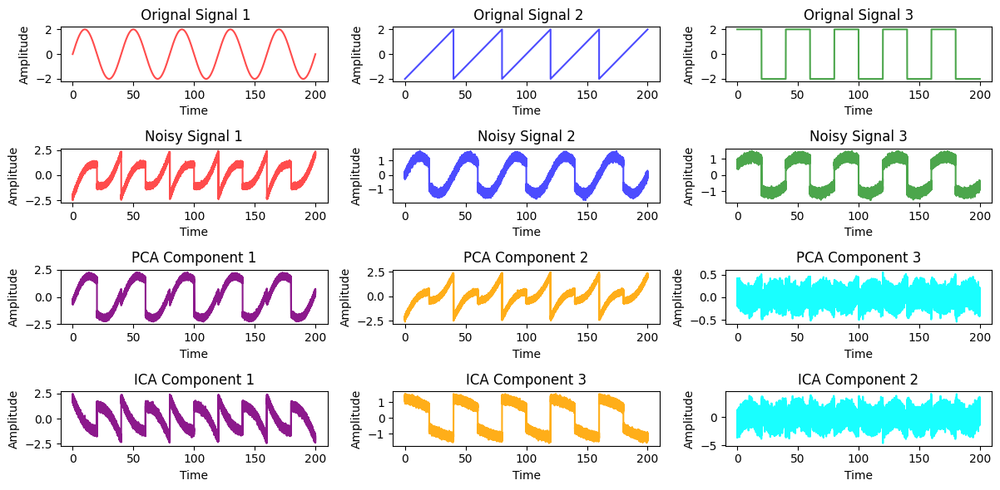

In [ ]:
time = np.linspace(0, 200, int(200 * 1000), endpoint=False)

fig, axes = plt.subplots(4, 3, figsize=(12, 6))

axes[0,0].plot(time,sine_wave,color="red",alpha=0.7)
axes[0,0].set_title(" Orignal Signal 1")
axes[0,1].plot(time,sawtooth_wave,color="blue",alpha=0.7)
axes[0,1].set_title(" Orignal Signal 2")
axes[0,2].plot(time,square_wave,color="green",alpha=0.7)
axes[0,2].set_title("Orignal Signal 3")

axes[1, 0].plot(time, X[:, 0], color="red", alpha=0.7)
axes[1, 0].set_title("Noisy Signal 1")
axes[1, 1].plot(time, X[:, 1], color="blue", alpha=0.7)
axes[1, 1].set_title("Noisy Signal 2")
axes[1, 2].plot(time, X[:, 2], color="green", alpha=0.7)
axes[1, 2].set_title("Noisy Signal 3")

axes[2,0].plot(time,transformed_data[:,0],color="purple",alpha=0.9)
axes[2,0].set_title("PCA Component 1")
axes[2,1].plot(time,transformed_data[:,1],color="orange",alpha=0.9)
axes[2,1].set_title("PCA Component 2")
axes[2,2].plot(time,transformed_data[:,2],color="cyan",alpha=0.9)
axes[2,2].set_title("PCA Component 3")

axes[3, 0].plot(time, S_ica[:, 0], color="purple", alpha=0.9)
axes[3, 0].set_title("ICA Component 1")
axes[3, 1].plot(time, S_ica[:, 1], color="orange", alpha=0.9)
axes[3, 1].set_title("ICA Component 3")
axes[3, 2].plot(time, S_ica[:, 2], color="cyan", alpha=0.9)
axes[3, 2].set_title("ICA Component 2")


for ax in axes.flatten():
    ax.set_xlabel("Time")
    ax.set_ylabel("Amplitude")

plt.tight_layout()
plt.show()


### **4.Which of the methods was better? Why might it be?**
Of the two methods in this case ICA seems to have performed better depending upon the neural gaussian noise in the system.ICA is used to find statistical independant components by utilizing the non gaussian distribution of independant components via the Central Limit Theorom.The result of Blind source separation problem is also dependant on the initial random state of the $W$ matrix for solving the inverse problem of blind source separation

## **Assignment - Part-B-EEG Data**

### **1. Visualize the ICs as topographical plots - can you spot the ECG and EOG artefactual components?**

In [ ]:
!pip install mne

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 46.5 MB/s eta 0:00:00


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import mne
from mne.preprocessing import ICA
import os

In [ ]:
from mne.datasets import sample
data_path = sample.data_path()
raw_fname = os.path.join(data_path, 'MEG', 'sample', 'sample_audvis_filt-0-40_raw.fif')
raw = mne.io.Raw(raw_fname)
raw.info

Using default location ~/mne_data for sample...
Creating /root/mne_data


100%|█████████████████████████████████████| 1.65G/1.65G [00:00<00:00, 1.10TB/s]
Untarring contents of '/root/mne_data/MNE-sample-data-processed.tar.gz' to '/root/mne_data'


Attempting to create new mne-python configuration file:
/root/.mne/mne-python.json
Download complete in 01m48s (1576.2 MB)
Opening raw data file /root/mne_data/MNE-sample-data/MEG/sample/sample_audvis_filt-0-40_raw.fif...
    Read a total of 4 projection items:
        PCA-v1 (1 x 102)  idle
        PCA-v2 (1 x 102)  idle
        PCA-v3 (1 x 102)  idle
        Average EEG reference (1 x 60)  idle
    Range : 6450 ... 48149 =     42.956 ...   320.665 secs
Ready.


<Info | 14 non-empty values
 bads: 2 items (MEG 2443, EEG 053)
 ch_names: MEG 0113, MEG 0112, MEG 0111, MEG 0122, MEG 0123, MEG 0121, MEG ...
 chs: 204 Gradiometers, 102 Magnetometers, 9 Stimulus, 60 EEG, 1 EOG
 custom_ref_applied: False
 dev_head_t: MEG device -> head transform
 dig: 146 items (3 Cardinal, 4 HPI, 61 EEG, 78 Extra)
 highpass: 0.1 Hz
 hpi_meas: 1 item (list)
 hpi_results: 1 item (list)
 lowpass: 40.0 Hz
 meas_date: 2002-12-03 19:01:10 UTC
 meas_id: 4 items (dict)
 nchan: 376
 projs: PCA-v1: off, PCA-v2: off, PCA-v3: off, Average EEG reference: off
 sfreq: 150.2 Hz
>

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Using matplotlib as 2D backend.


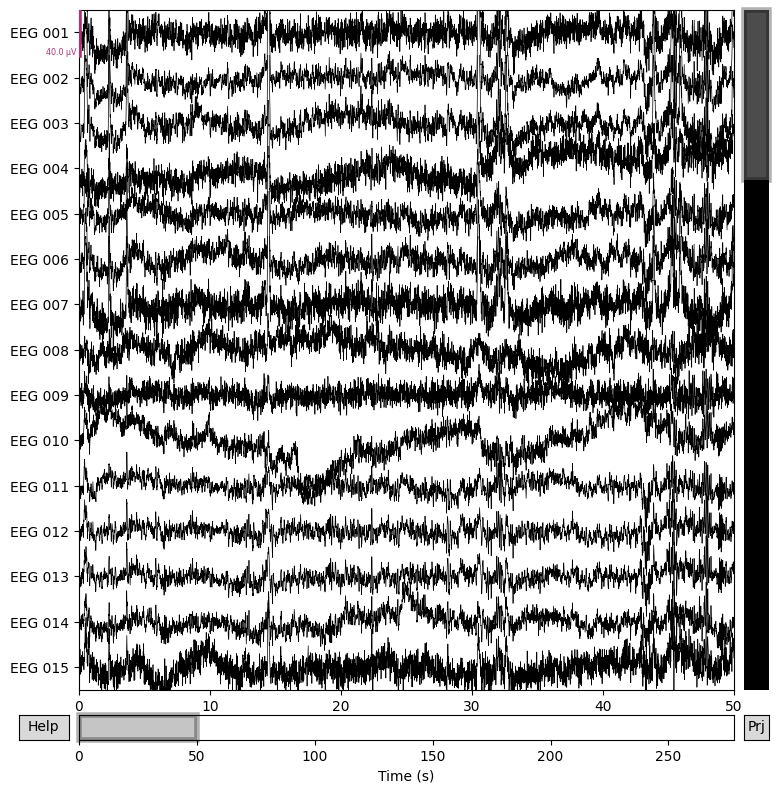

In [ ]:
raw_eeg = raw.copy()
raw_eeg.pick_types(meg=False, eeg=True, eog=True, ecg=True) # Selecting EEG, EOG and ECG channels <====== EDITME
x = raw_eeg.plot(duration=50,n_channels=15) # Tweak duration & number of channels <====== EDITME

In [ ]:
ica_eeg = ICA(n_components=15, random_state=97) #Setup ICA <======= EDITME
ica_eeg.fit(raw_eeg) # Run ICA

Fitting ICA to data using 59 channels (please be patient, this may take a while)
Selecting by number: 15 components
Fitting ICA took 2.1s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,32 iterations on raw data (41700 samples)
ICA components,15
Available PCA components,59
Channel types,eeg
ICA components marked for exclusion,—


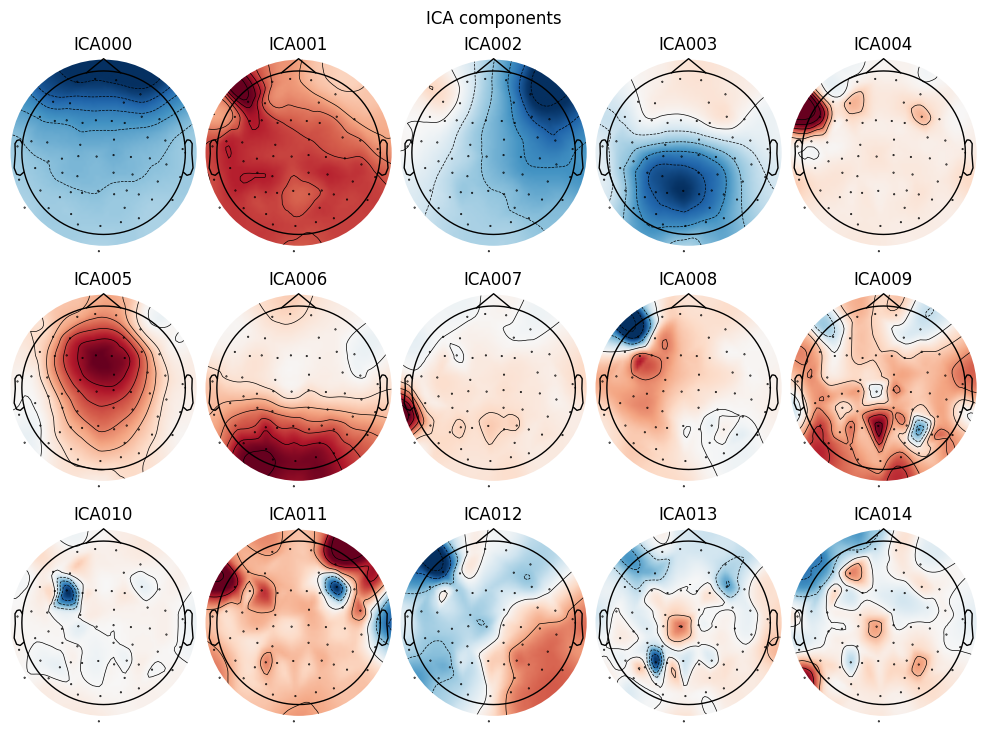

In [ ]:
x = ica_eeg.plot_components() #Plot topographies

* By observing the topographical plots we can we can say that ICA000 is due to EOG potential from which is seem as a dipole from the Fz to the ocipital .
* Similarly ICA001 has a similar topological distribution possibly a saccade of eye
* ICA005 is an ECG artifact due to it being present in the post central gyrus and  the localized patern in the central gyrus
* ICA006 possibly respresents some visual dipole  for vision processing due to being present in the ocipital lobe

### **2.Visualize the ICs as topographical AND time-series plots - can you spot the ECG and EOG artefactual components now?**

*Plotting the Power Spectral Densities of the Independant Components*

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 pro

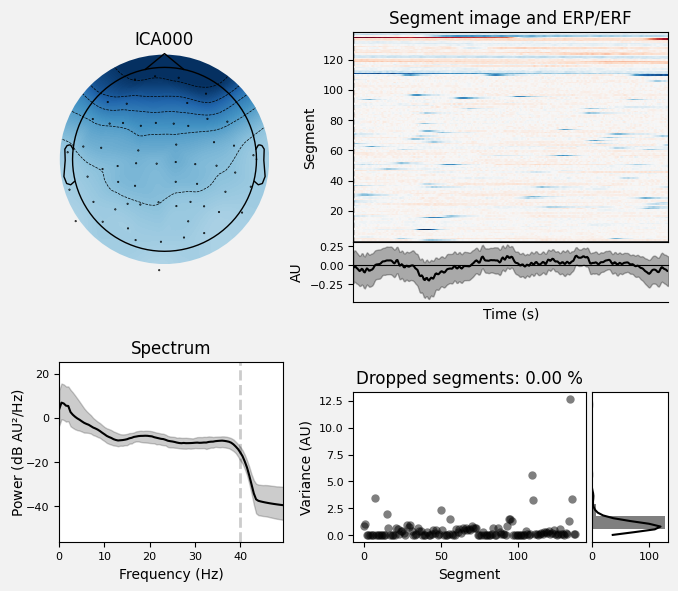

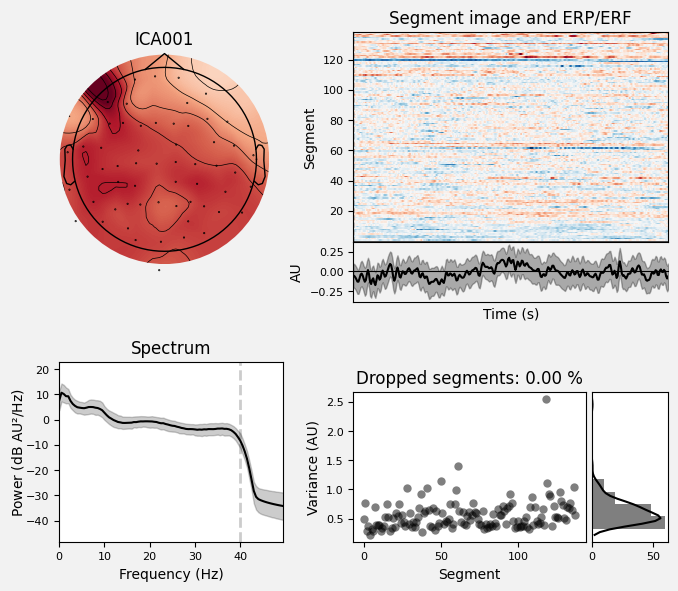

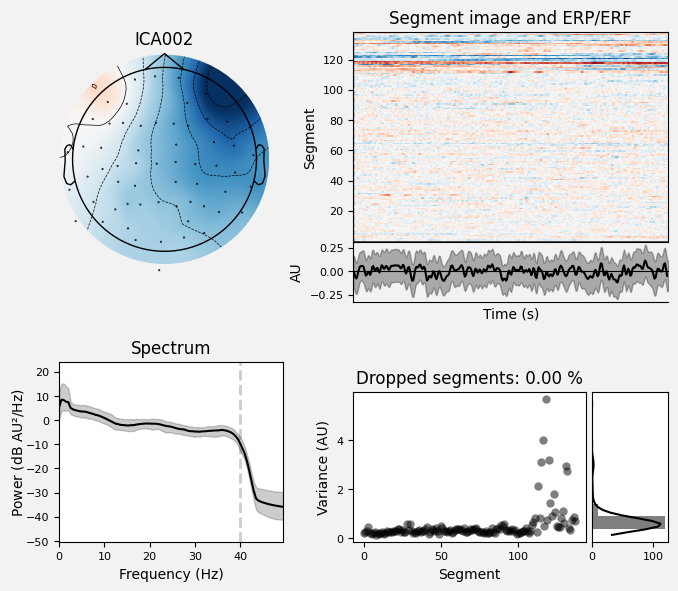

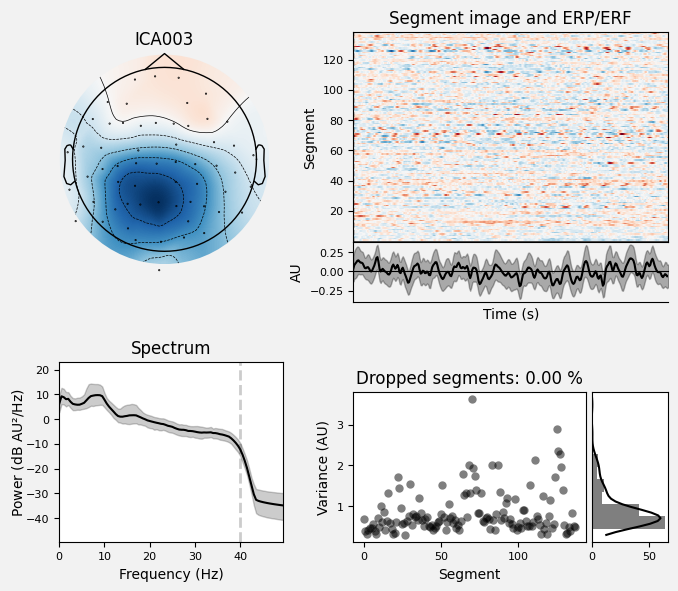

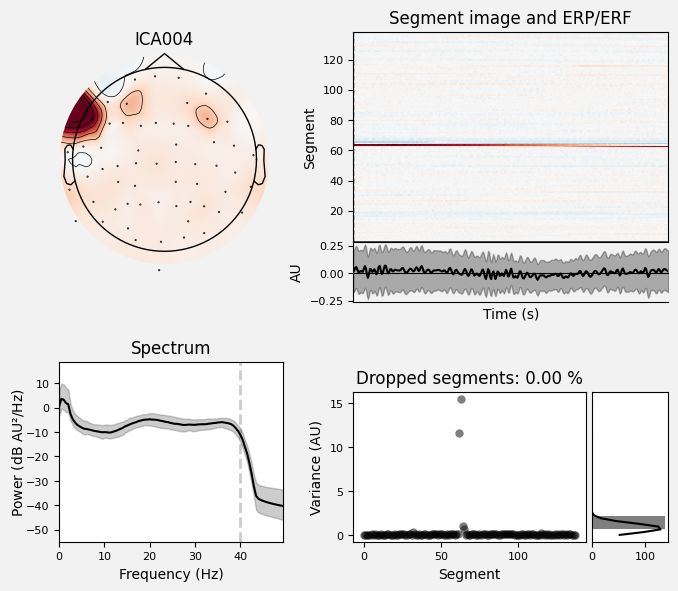

...

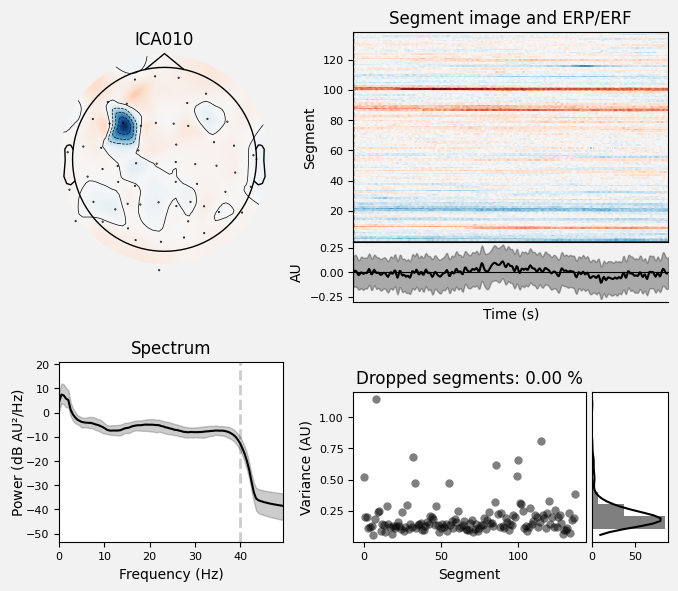

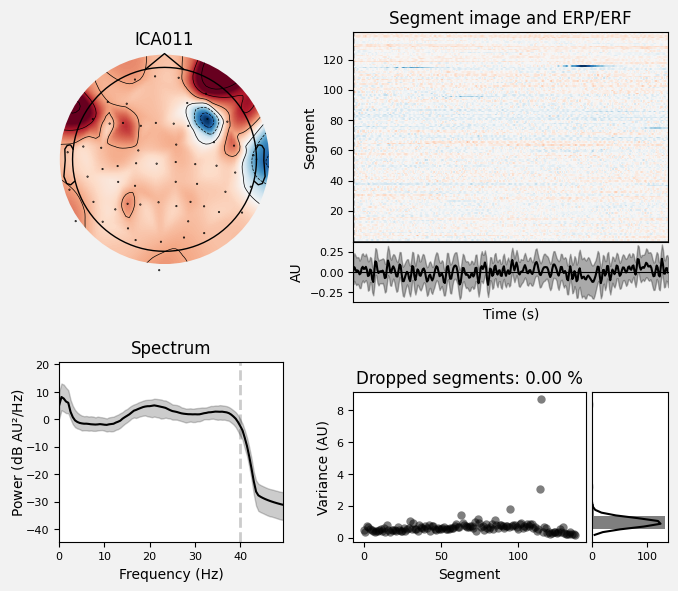

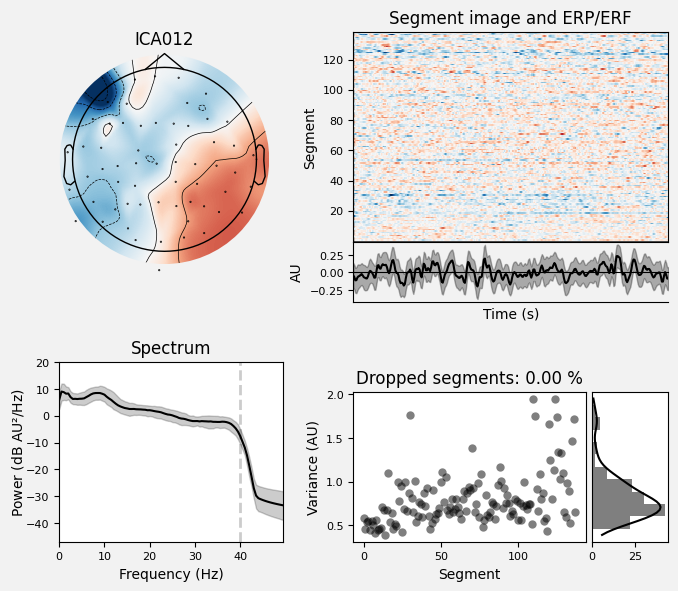

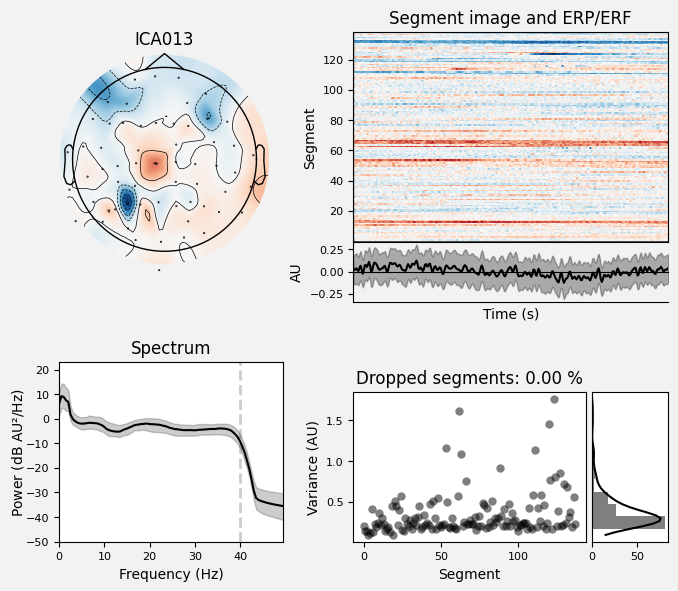

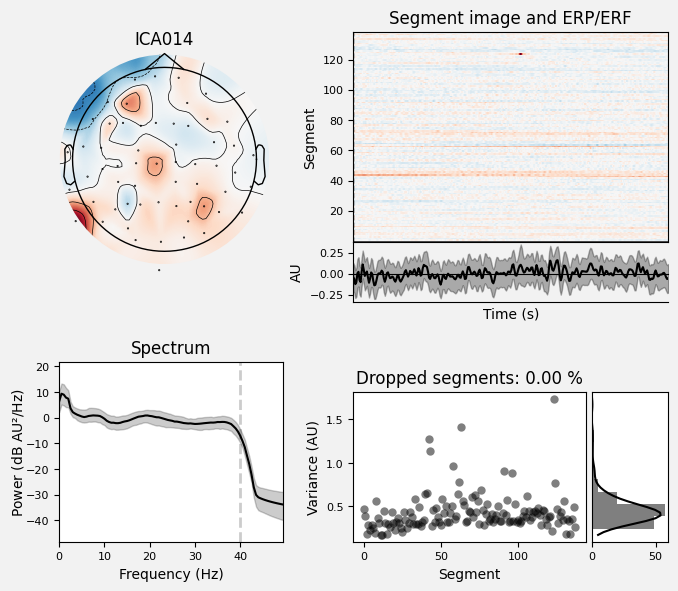

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
ica_eeg.plot_properties(raw_eeg, picks=range(15))

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 13.639 (s)
Plotting power spectral density (dB=True).


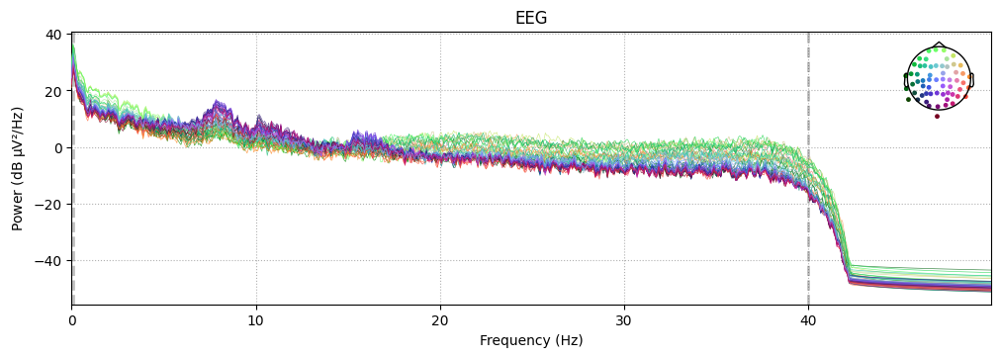

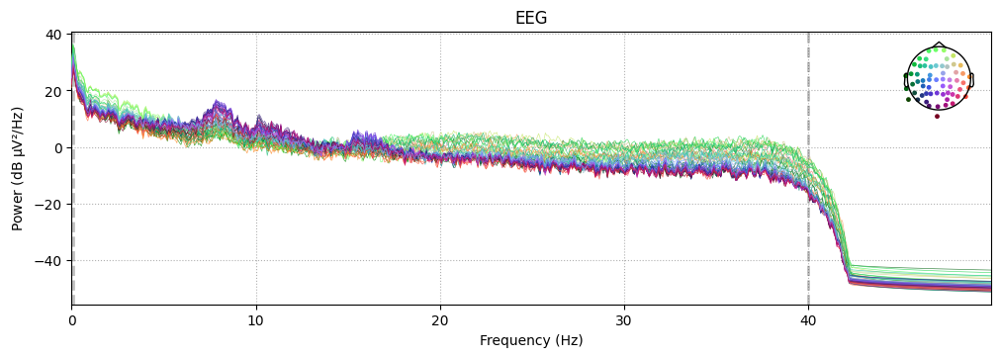

In [ ]:
raw_eeg.plot_psd(fmax=50)

* Similarly from the Topographical and power spectral density we can conclude that ICA000 , ICA001 ,ICA005,ICA009,ICA010,ICA018,ICA019 are artifacts

### **3.Remove the possible artefactual components and replot the data and see if the ECG/EOG artefacts are removed. Did it work?**

Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 6 ICA components
    Projecting back using 59 PCA components


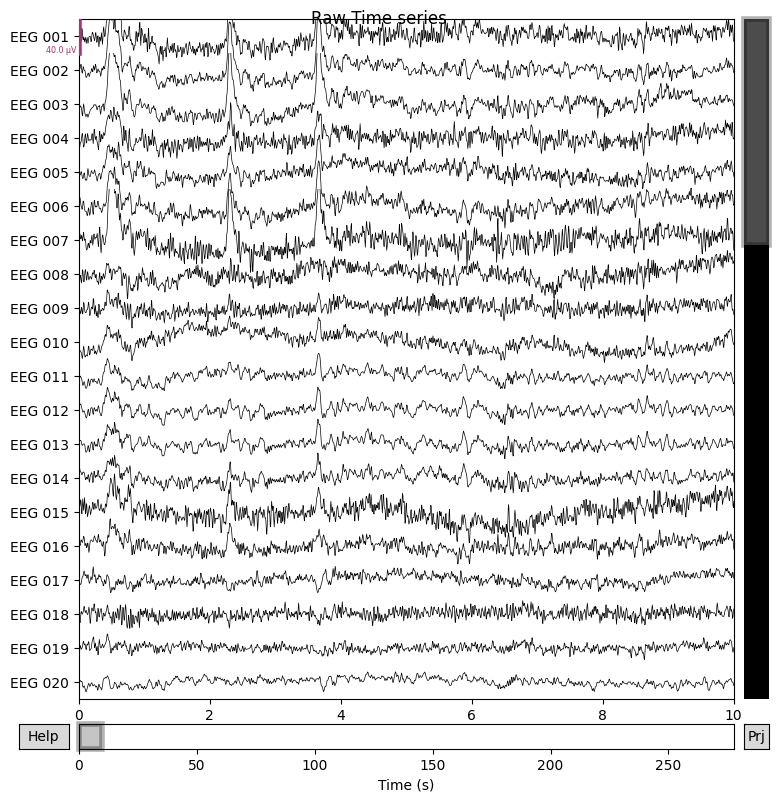

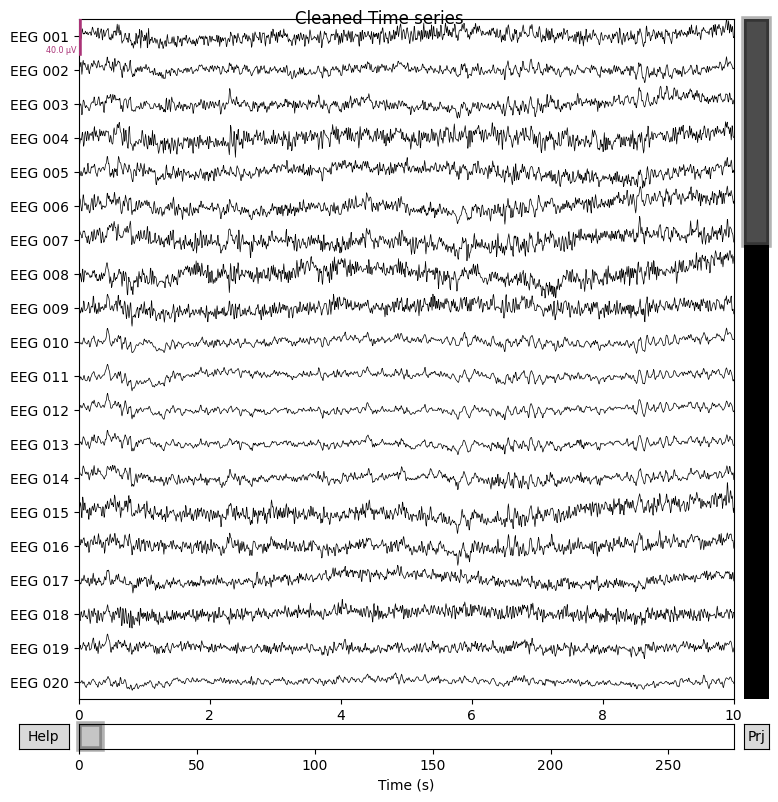

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 13.639 (s)
Plotting power spectral density (dB=True).
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 13.639 (s)
Plotting power spectral density (dB=True).


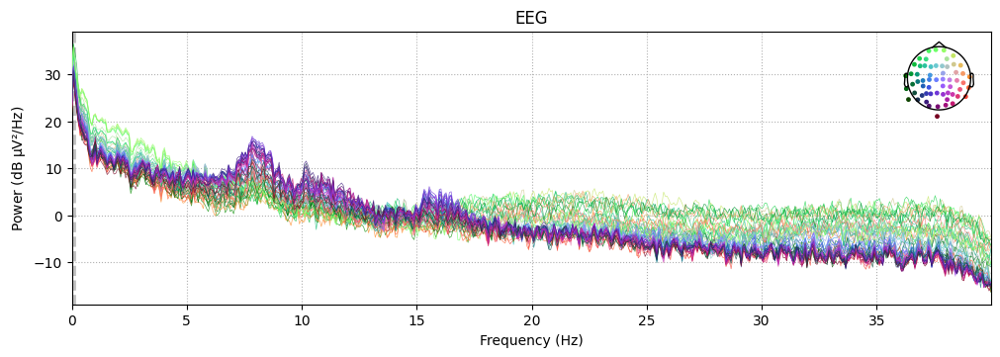

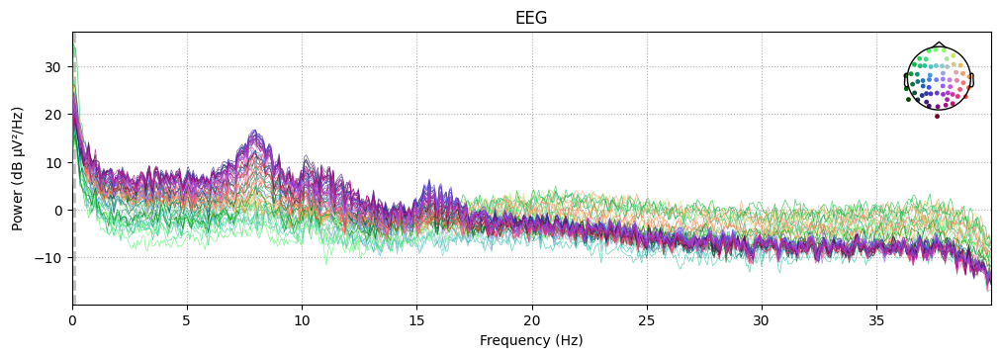

In [ ]:
raw_eeg.load_data()

ica_eeg.exclude = [0,1,5,9,11,10]  # indices chosen based on various plots above <======

# ica.apply() changes the Raw object in-place, so let's make a copy first:
reconst_raw = raw_eeg.copy()
ica_eeg.apply(reconst_raw)

#Raw
raw_eeg.plot(show=False)
plt.suptitle('Raw Time series')


#Reconstruced after removing artefactual components
reconst_raw.plot(show=False)
plt.suptitle('Cleaned Time series')
plt.show()

raw_eeg.plot_psd(fmax=40)
reconst_raw.plot_psd(fmax=40)
plt.show()

# del reconst_raw

*  By removing the unwanted Indepdentant components we a more distinct power spectral density in the paraital and ocipital lobes

*a)Perhaps add a few more components if it didn’t?*

Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 7 ICA components
    Projecting back using 59 PCA components


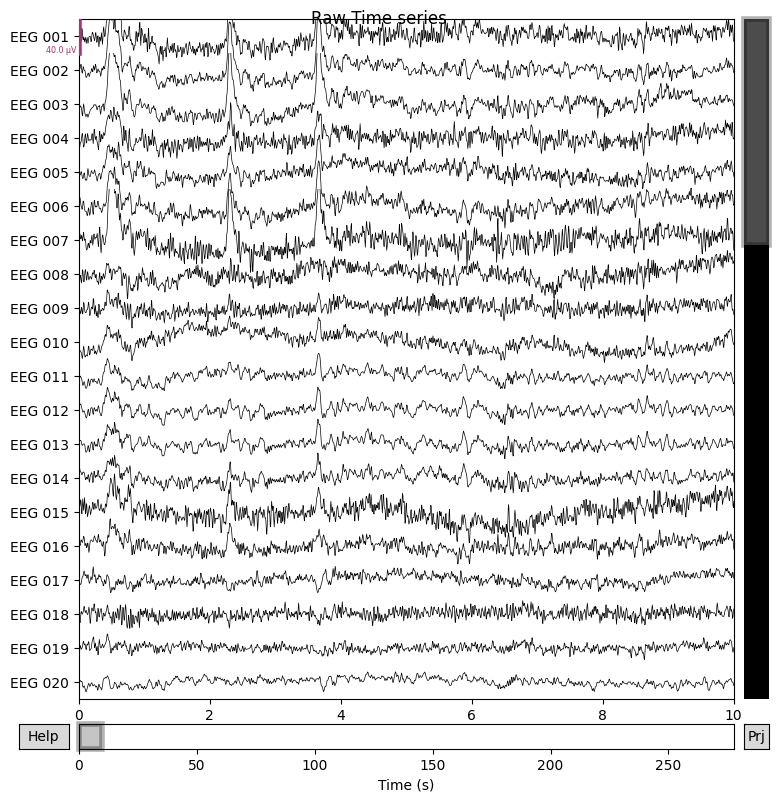

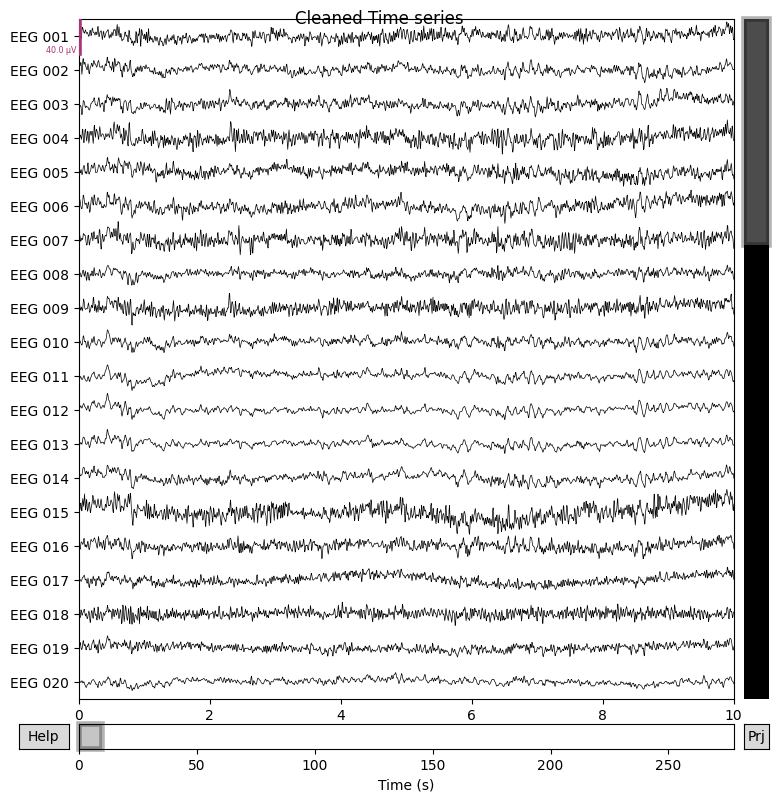

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 13.639 (s)
Plotting power spectral density (dB=True).
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 13.639 (s)
Plotting power spectral density (dB=True).


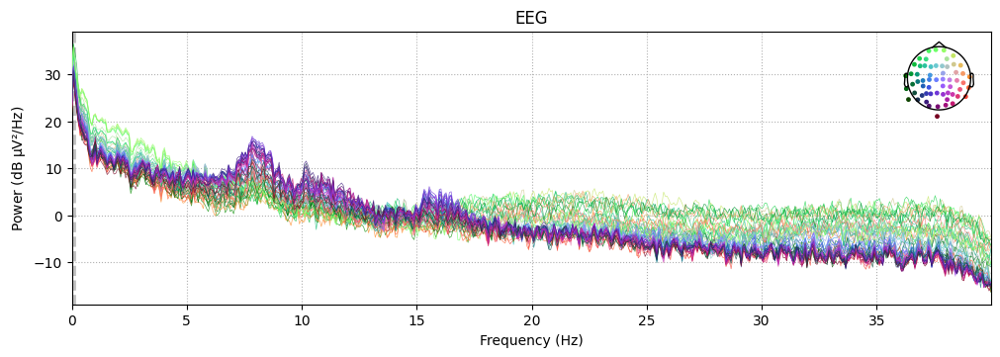

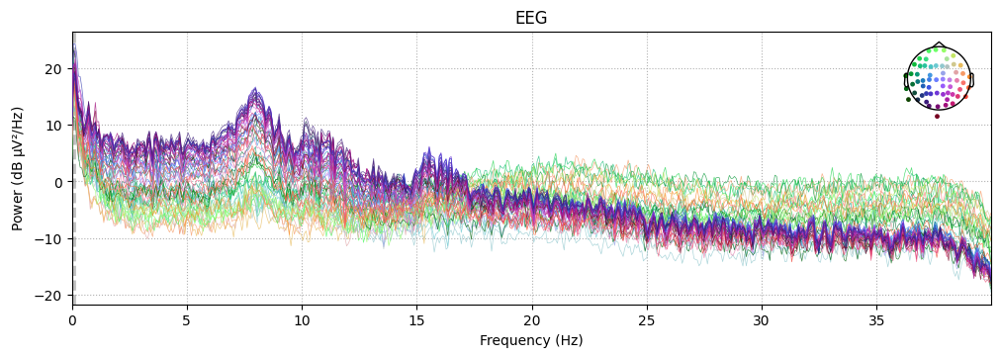

In [ ]:
raw_eeg.load_data()

ica_eeg.exclude = [0,1,2,4,7,5,10,18,19]  # indices chosen based on various plots above <======

# ica.apply() changes the Raw object in-place, so let's make a copy first:
reconst_raw = raw_eeg.copy()
ica_eeg.apply(reconst_raw)

#Raw
raw_eeg.plot(show=False)
plt.suptitle('Raw Time series')


#Reconstruced after removing artefactual components
reconst_raw.plot(show=False)
plt.suptitle('Cleaned Time series')
plt.show()

raw_eeg.plot_psd(fmax=40)
reconst_raw.plot_psd(fmax=40)
plt.show()

# del reconst_raw

*  Upon adding ICA004 and ICA007 more distinct spectra is observed

*b)Reduce the dropped components and see if the artefacts stay removed or if
they come back onto the signal?*
By reducing any of the above dropped components, the artefacts are coming back that implies that the dropped components contains artefact. It may be possible that those components also contain some amount of signal that is lost now.

*c)Was there a difference in the ECG and EOG artefacts in MEG vs EEG?
Explain what you observe in this respect (Use the second part of the
Jupyter notebook to try it out)*

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


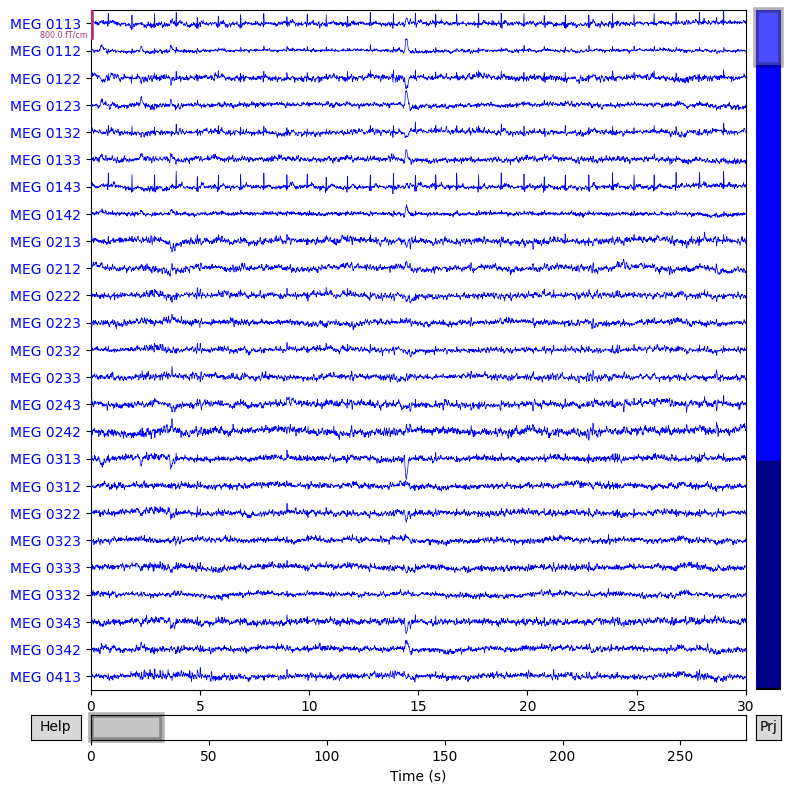

In [ ]:
raw_meg = raw.copy()
raw_meg.pick_types(meg=True, eeg=False, eog=True, ecg=True) # Selecting MEG, EOG and ECG channels <======
x = raw_meg.plot(duration=30,n_channels=25) # Tweak duration & number of channels <======

In [ ]:
ica_meg = ICA(n_components=20, random_state=97) #Setup ICA <=======
ica_meg.fit(raw_meg) # Run ICA

Fitting ICA to data using 305 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 13.3s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,56 iterations on raw data (41700 samples)
ICA components,20
Available PCA components,305
Channel types,"mag, grad"
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=21, n_times=41700
    Range : 6450 ... 48149 =     42.956 ...   320.665 secs
Ready.


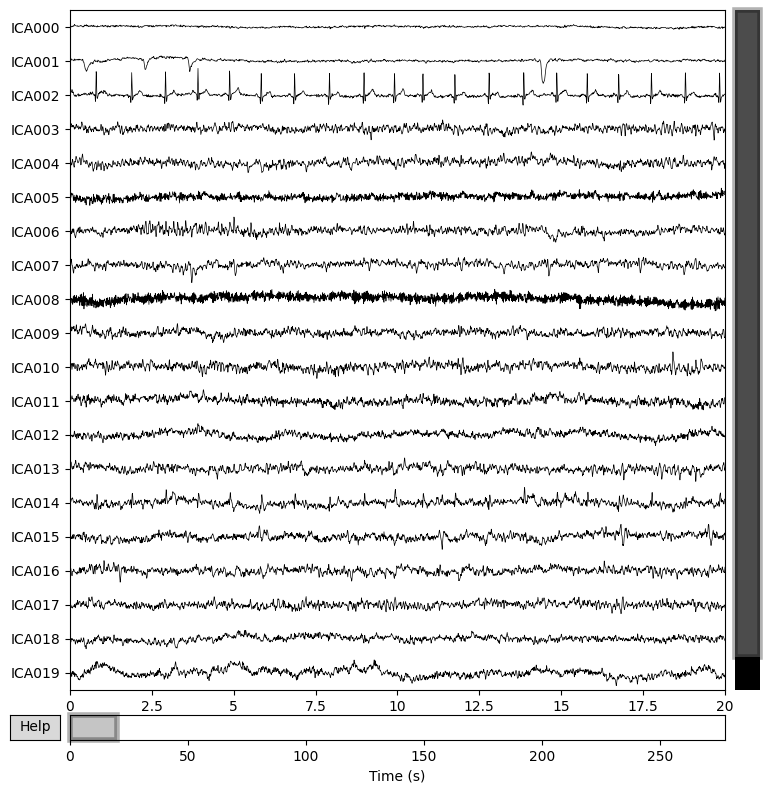

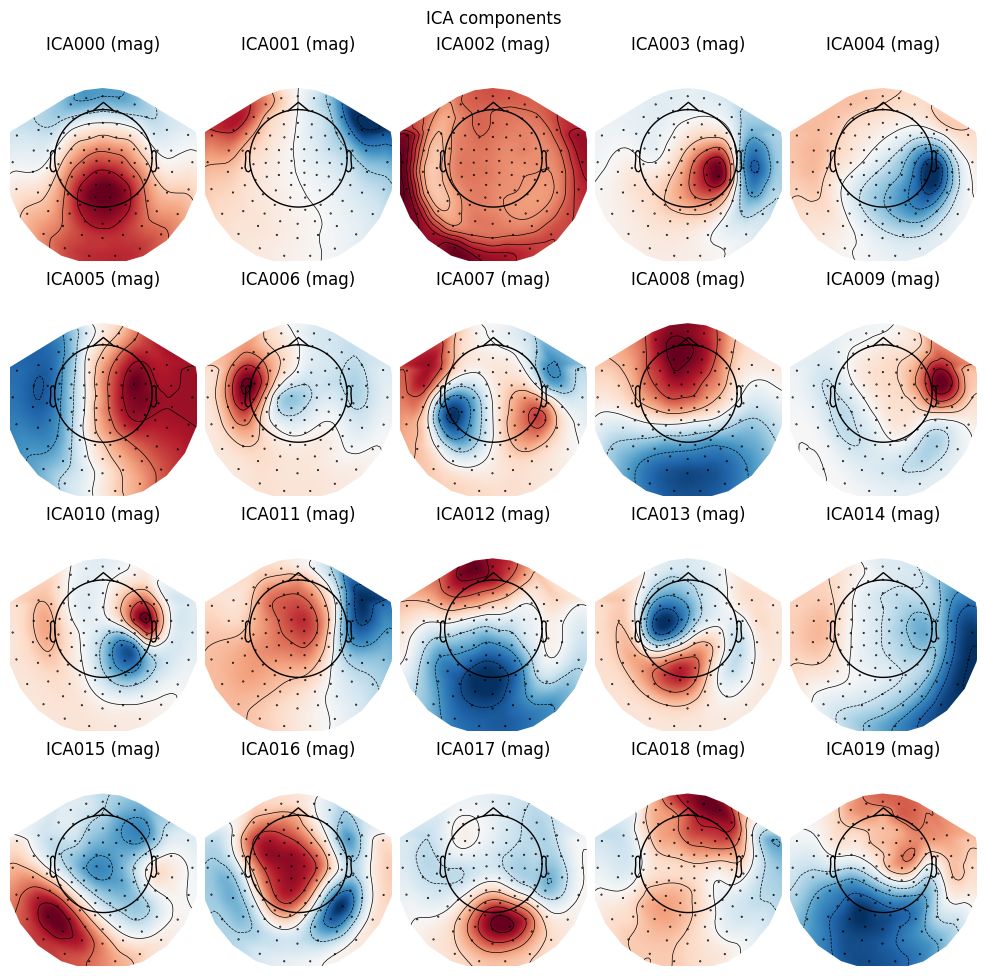

In [ ]:
x = ica_meg.plot_sources(raw_meg) # Plot time series
x = ica_meg.plot_components() #Plot topographies

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 pro

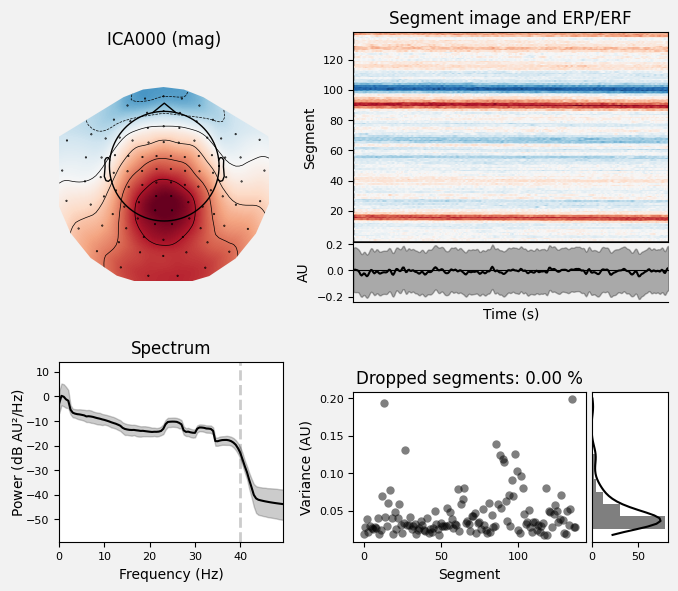

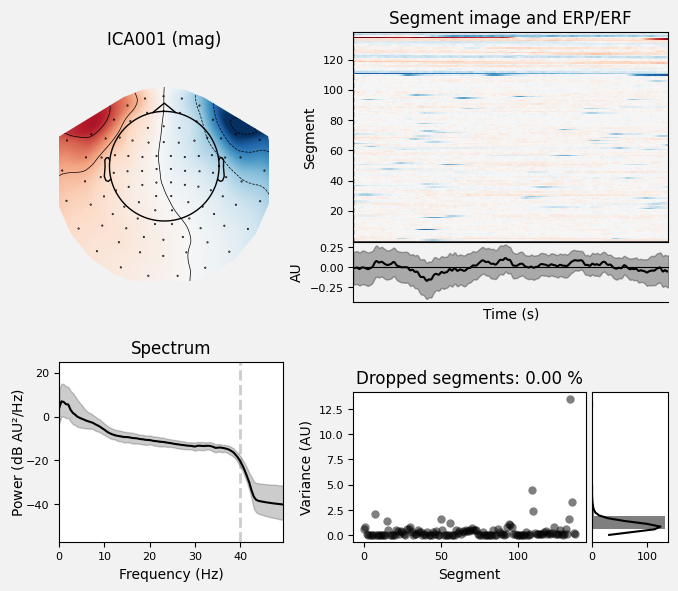

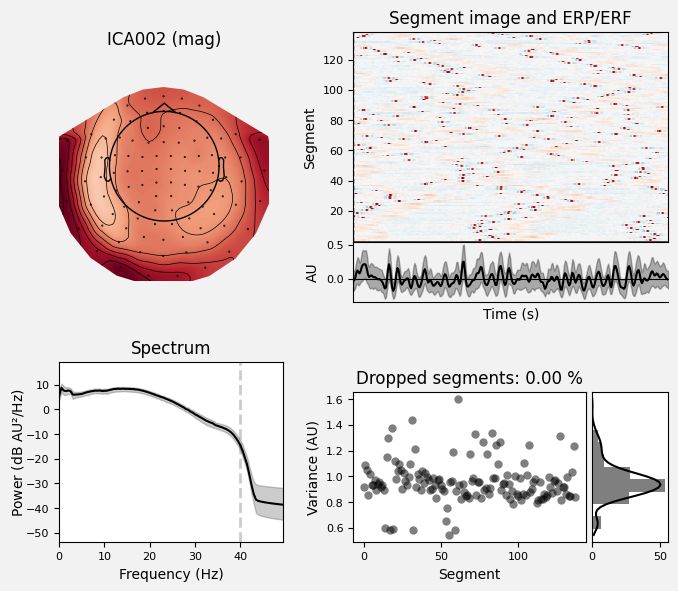

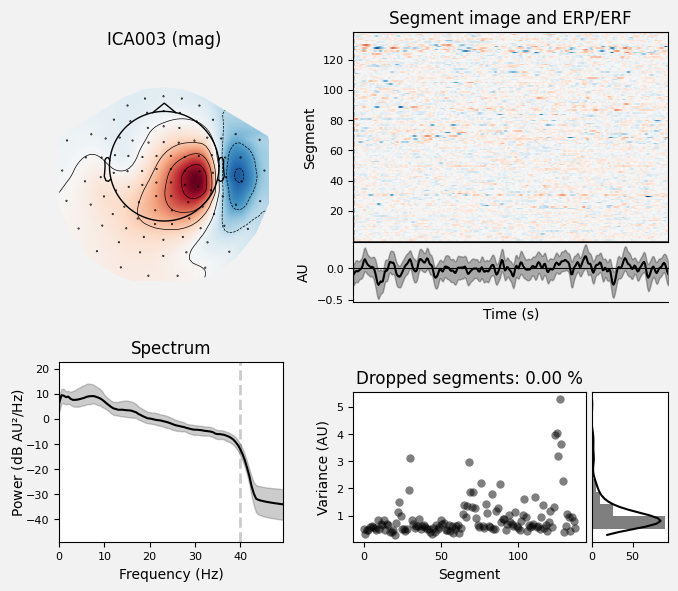

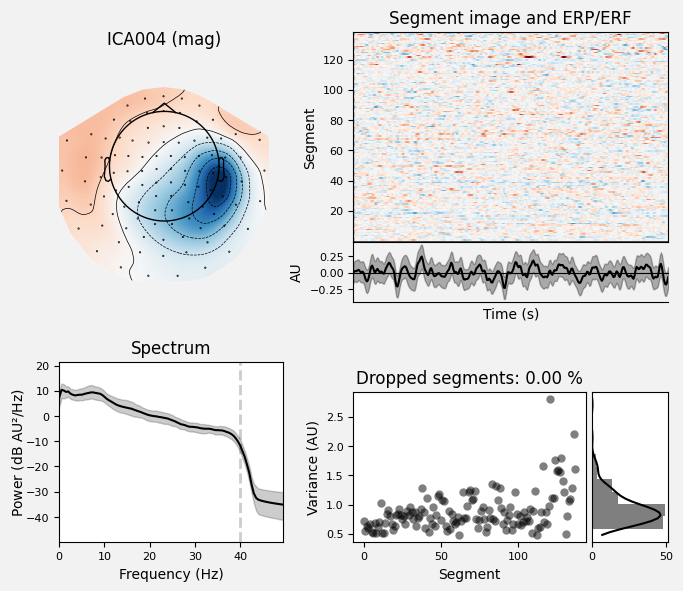

...

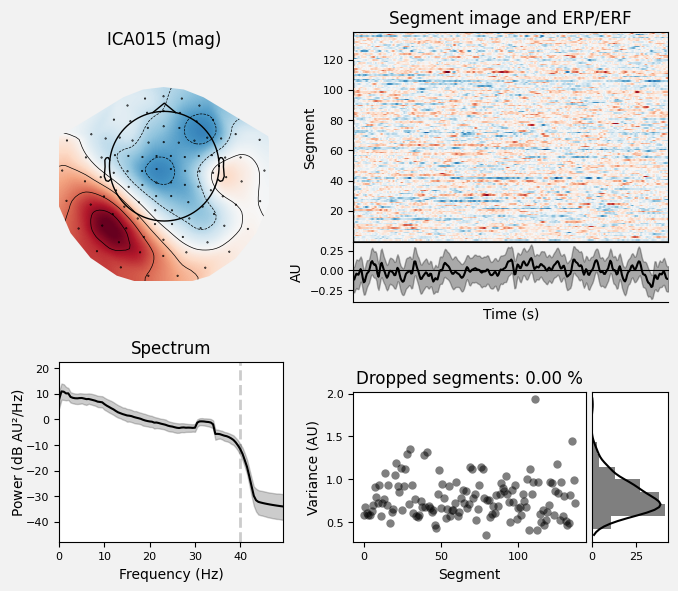

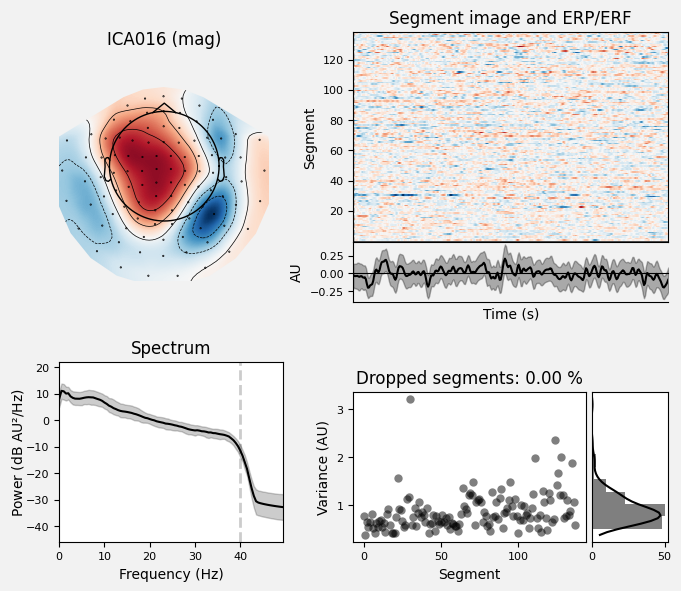

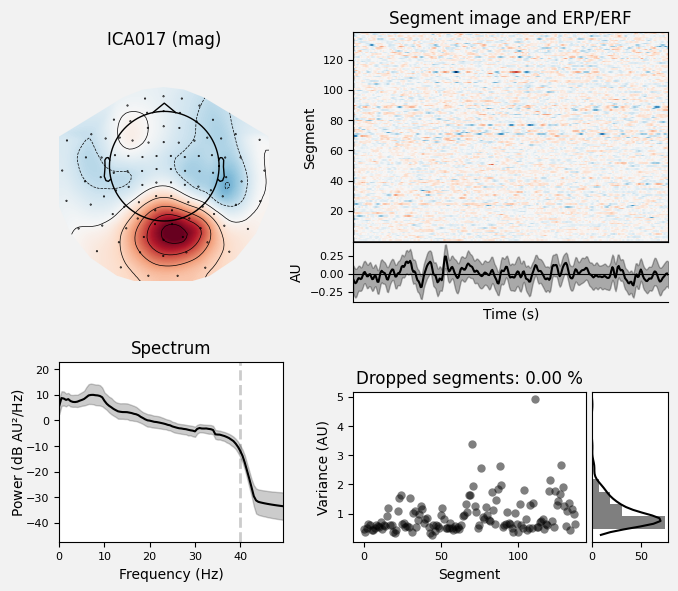

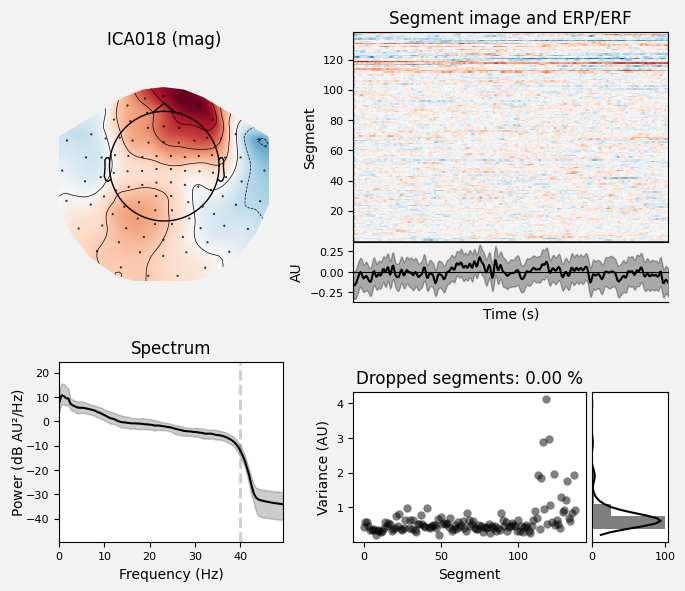

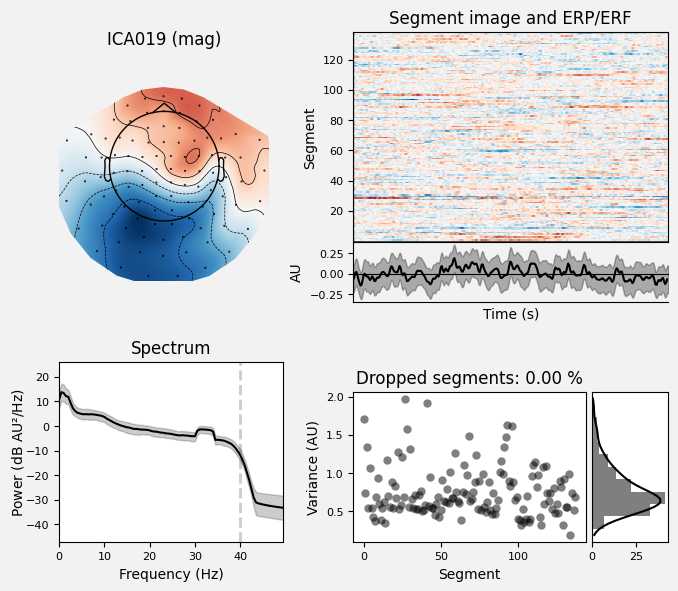

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
ica_meg.plot_properties(raw_meg, picks=range(20))

Reading 0 ... 41699  =      0.000 ...   277.709 secs...
Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 5 ICA components
    Projecting back using 305 PCA components


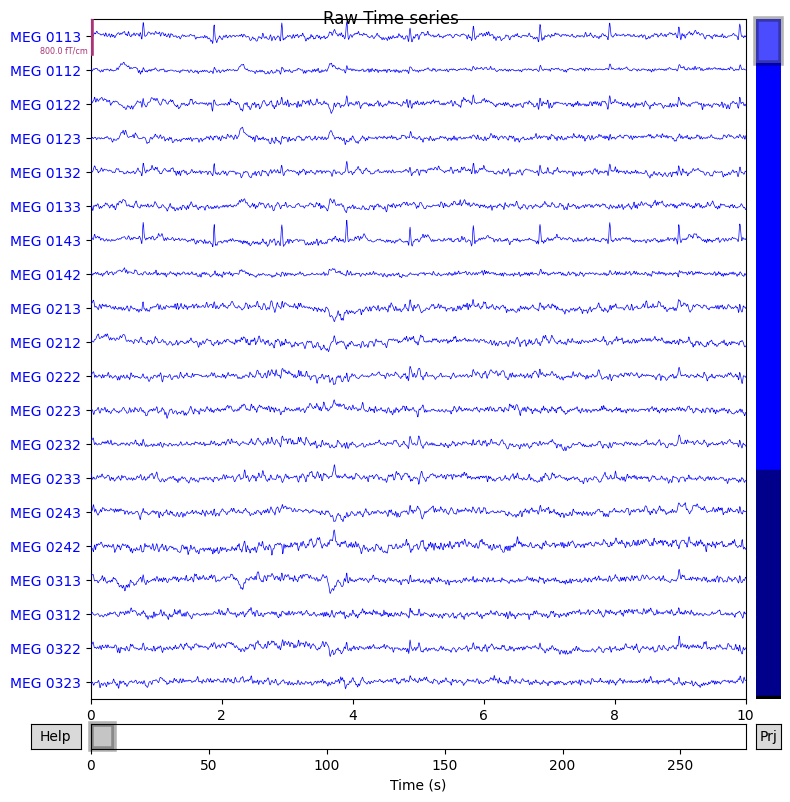

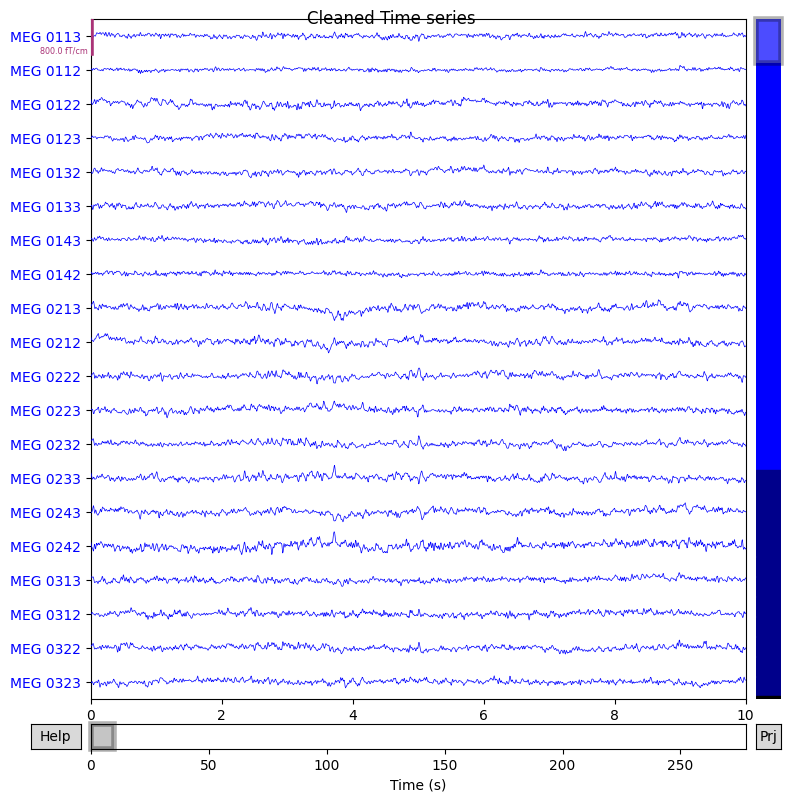

In [ ]:
raw_meg.load_data()

ica_meg.exclude = [0,1,5,8,19]  # indices chosen based on various plots above <======

# ica.apply() changes the Raw object in-place, so let's make a copy first:
reconst_raw = raw_meg.copy()
ica_meg.apply(reconst_raw)

#Raw
raw_meg.plot(show=False)
plt.suptitle('Raw Time series')


#Reconstruced after removing artefactual components
reconst_raw.plot(show=False)
plt.suptitle('Cleaned Time series')
plt.show()
del reconst_raw

* Here also we can identify similar aartifacts-ICA000,ICA001 are EOG artifacts ICA005 is ECG ICA008 and ICA019 are due to muscle activity

### **4.How should the dipoles be positioned to create such topographies in EEG? (Hint:Think about the previous assignment)**
* To generate such potential field the dipoles must be positioned tangential to the sucli surface
* The  dipole must be place along the gradient of the maximum potentials to recreate the topographical plot

## **Optional**

### **5.What happens if you change the n_components or the number of ICAcomponents to be decomposed?**

* Upon Increasing the n_components we may encounter noise and more specific artefacts as Independant Components
* Upon Decreasing the n_components there may be convergence issues in the algorithm and possibly multiple signals can represent one Independant Component


### **6.What happens if you change the seed parameter?**
* The seed algorithm determines the initial set of $W$ matrix which sould affect the independant components of the topo plots

### **7.Does it still work well without the reference ECG/EOG channels added along with the EEG data during ICA separation?**
* Reference channels  information to the ICA to identify artifacts.If these are not included the artifact identification may be incorrect

### **8.How does MNE-Python actually perform ICA? What are the different steps? Is PCA a part of it?**
* Yes PCA is a part of it

Steps
* Perform PCA
### 3. Finding the Unmixing Matrix (\(\mathbf{W}\))  
Maximizing statistical independence (e.g., using **Kurtosis** or **Negentropy**) involves iterating through algorithms such as **FastICA**, which uses the following update rule:

$$\mathbf{w}_{\text{new}} = \text{E}[\mathbf{X} \cdot g(\mathbf{w}^T \mathbf{X})] - \text{E}[g'(\mathbf{w}^T \mathbf{X})] \cdot \mathbf{w}
$$
Where:  
- $g$ is a non-linear function (like **tanh** or **exponential**).  

The weights are then **normalized**:

$$
\mathbf{w} = \frac{\mathbf{w}}{||\mathbf{w}||_2}
$$
* This is done iteratively untill the algorithm converges to a $W$